In [2]:
%matplotlib inline

import numpy as np
import matplotlib.pyplot as plt

In [8]:
data = ("John", "Doe", 53.44)
format_string = "Hello"
print("%s" %format_string)
print("%s %s %s. Your current balance is $%s" % (format_string,*data))
print(f"{format_string} {data[0]} {data[1]}. Your current balance is ${data[2]}")

Hello
Hello John Doe. Your current balance is $53.44
Hello John Doe. Your current balance is $53.44


## Laden einer JPEG-Datei als Numpy-Array

Lassen Sie uns [scikit-image](http://scikit-image.rg) verwenden, um den Inhalt einer JPEG-Datei in ein Numpy-Array zu laden:

In [34]:
from skimage.io import imread

image = imread('laptop.jpeg')
type(image)

numpy.ndarray

Die Eigenschaften des Arrays sind:
- Höhe
- Breite
- Farbkanäle (RGB)


In [35]:
image.shape

(450, 800, 3)

Aus Effizienzgründen werden die Pixelintensitäten jedes Kanals als **8-Bit-Ganzzahl ohne Vorzeichen** mit Werten im Bereich **[0-255]** gespeichert:

In [4]:
image.dtype

dtype('uint8')

In [5]:
image.min(), image.max()

(np.uint8(0), np.uint8(255))

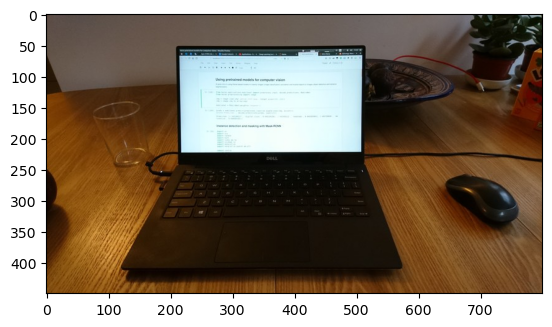

In [36]:
plt.imshow(image)

### Größe des numpy array

Die Größe in Bytes kann berechnet werden, indem die Anzahl der Elemente mit der Größe in Bytes jedes Elements im Array multipliziert wird.

Die Größe eines Elements hängt vom Datentyp ab.

1 Byte == 8 Bit


In [10]:
np.prod(image.shape)

np.int64(1080000)

In [11]:
450 * 800 * 3 * (8 / 8)

1080000.0

Lassen Sie uns dies überprüfen, indem wir numpy fragen:

In [12]:
print("image size: {:0.3} MB".format(image.nbytes / 1e6))

image size: 1.08 MB


Durch die Indizierung der letzten Dimension ist es möglich, den 2D-Inhalt eines bestimmten Farbkanals zu extrahieren, beispielsweise des roten Kanals:

In [13]:
red_channel = image[:, :, 0]
red_channel

array([[ 94,  93,  92, ..., 144,  85,  87],
       [ 95,  93,  92, ..., 153, 102,  74],
       [ 95,  94,  92, ..., 154, 104,  43],
       ...,
       [127, 133, 132, ..., 119, 124, 123],
       [128, 135, 126, ..., 119, 125, 126],
       [128, 134, 126, ..., 118, 125, 126]], dtype=uint8)

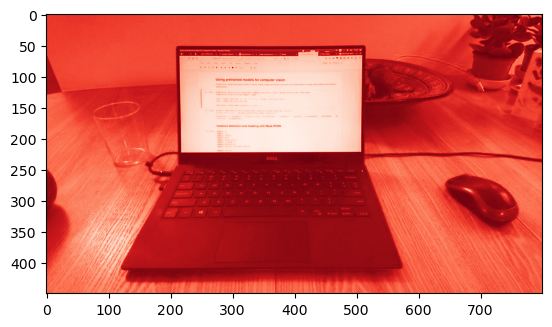

In [14]:
plt.imshow(image[:, :, 0], cmap=plt.cm.Reds_r);

### Aufgabe

- Berechnen Sie eine Graustufenversion des Bildes mit der Form „(Höhe, Breite)“, indem Sie die Werte über Farbkanäle mit [image.mean](https://docs.scipy.org/doc/numpy/reference/generated) mitteln /numpy.mean.html).

- Zeichnen Sie das Ergebnis mit „plt.imshow“ unter Verwendung einer Graustufen-Farbkarte.

- Kann der ganzzahlige Datentyp uint8 diese Durchschnittswerte darstellen? Überprüfen Sie den von Numpy verwendeten Datentyp.

- Wie groß ist dieses Bild in (Mega-)Bytes? 

- Was ist der erwartete Wertebereich für die neuen Pixel?

float64
Bildgröße: 2.88 MB


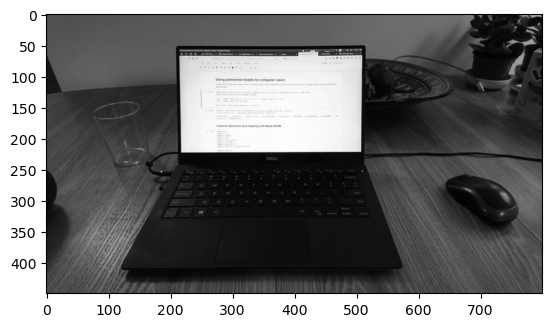

In [37]:
image_gray = imread('laptop.jpeg')
image_gray = np.mean(image, axis=2)

plt.imshow(image_gray,cmap= 'gray')

print(image_gray.dtype)

print("Bildgröße: {:0.3} MB".format(image_gray.nbytes / 1e6))

## Größenänderung von Bildern, Umgang mit Datentypen und Dynamikbereichen



Wenn es sich um eine heterogene Sammlung von Bildern unterschiedlicher Größe handelt, ist es häufig erforderlich, die Bildgröße auf die gleiche Größe zu ändern. Genauer gesagt:

- Für die **Bildklassifizierung** erwarten die meisten Netzwerke eine bestimmte **feste Eingabegröße**;

– Für die **Objekterkennung** und Instanzsegmentierung verfügen Netzwerke über mehr Flexibilität, aber das Bild sollte **ungefähr die gleiche Größe wie die Bilder des Trainingssatzes** haben.

Darüber hinaus können **große Bilder viel langsamer verarbeitet werden** als kleinere Bilder (die Anzahl der Pixel variiert quadratisch mit der Höhe und Breite).

In [40]:
from skimage.transform import resize

image = imread('laptop.jpeg')
lowres_image = resize(image, (50, 50), mode='reflect', anti_aliasing=True)
lowres_image.shape

(50, 50, 3)

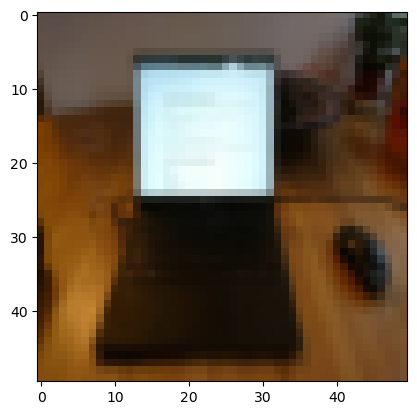

In [41]:
plt.imshow(lowres_image, interpolation='nearest');

Die Werte der Pixel des Bildes mit niedriger Auflösung werden aus der Kombination der Werte der Pixel im Bild mit hoher Auflösung berechnet. Das Ergebnis wird daher als Gleitkommazahl dargestellt.


In [42]:
lowres_image.dtype

dtype('float64')

Konventionell gehen sowohl „skimage.transform.imresize“ als auch „plt.imshow“ davon aus, dass Gleitkommawerte im Bereich von 0,0 bis 1,0 liegen, wenn Gleitkommazahlen verwendet werden, im Gegensatz zu 0 bis 255, wenn 8-Bit-Ganzzahlen verwendet werden:

In [43]:
lowres_image.min(), lowres_image.max()

(0.0014874607074097058, 0.9998047196746886)

Beachten Sie, dass Keras andererseits möglicherweise Bilder erwartet, die mit Werten im Bereich „[0,0 – 255,0]“ codiert sind, unabhängig vom Datentyp des Arrays. Um die implizite Konvertierung in den Bereich „[0.0 – 1.0]“ zu vermeiden, verwenden wir die Option „preserve_range=True“.

In [44]:
lowres_large_range_image = resize(image, (50, 50), mode='reflect',
                                  anti_aliasing=True, preserve_range=True)

In [45]:
lowres_large_range_image.shape

(50, 50, 3)

In [46]:
lowres_large_range_image.dtype

dtype('float64')

In [47]:
lowres_large_range_image.min(), lowres_large_range_image.max()

(0.3793024803894749, 254.95020351704568)

**Warnung:** Das Verhalten von „plt.imshow“ hängt sowohl vom dtype als auch vom Dynamikbereich bei der Anzeige von RGB-Bildern ab. Insbesondere funktioniert es nicht bei RGB-Bildern mit float64-Werten im Bereich „[0,0 – 255,0]“:

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


[[[ 91.88162732  76.92189307  70.34748564]
  [ 90.43645816  77.02868215  72.69999742]
  [ 88.31723825  76.9116324   71.54237851]
  ...
  [ 39.9963634   50.47348439  41.13868176]
  [ 89.59276282 105.81879628 104.98182051]
  [ 97.95976609 111.55062046 108.0168759 ]]

 [[ 92.25429075  77.49199496  70.58695308]
  [ 91.32192913  78.30520577  72.44540332]
  [ 89.91222592  78.15729849  72.39639177]
  ...
  [ 34.58546283  44.24437364  31.64256525]
  [ 31.21035776  42.69849604  28.65882642]
  [ 25.17162184  34.32157158  20.24184939]]

 [[ 92.8484851   78.24695838  71.19435863]
  [ 92.66016933  78.89661097  72.56300033]
  [ 92.1711448   79.15755639  72.61532257]
  ...
  [ 30.92339993  38.60305541  25.71024664]
  [ 41.64863339  51.88320028  39.27693077]
  [ 51.67373609  63.54771529  50.74719138]]

 ...

 [[126.48802487  74.88178448  14.71102804]
  [134.03153319  81.56485383  17.43678552]
  [136.77981313  83.27820652  18.24695606]
  ...
  [114.99743988  73.42364327  37.85483723]
  [113.33832442  7

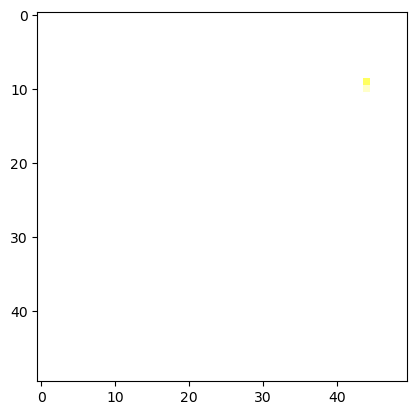

In [48]:
plt.imshow(lowres_large_range_image, interpolation='nearest');

print(lowres_large_range_image)

### Aufgabe

Schlagen Sie zwei Möglichkeiten vor, um ein RGB-Array mit Gleitkommawerten im Bereich „[0,0 – 255,0]“ korrekt anzuzeigen:



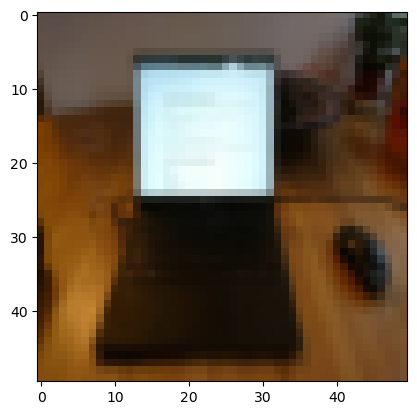

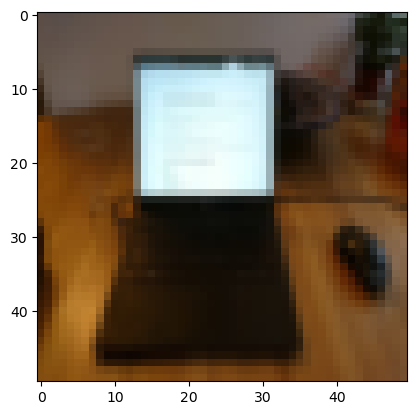

In [54]:
normalized_image = lowres_large_range_image / 255.0
plt.imshow(normalized_image)
plt.show()

# Möglichkeit 2: vmin und vmax spezifizieren

plt.imshow(np.round(lowres_large_range_image).astype(np.uint8), vmin=0, vmax=255)
plt.show()

## Verwendung eines vorab trainierten Modells

Ziele:

- Laden Sie ein vorab trainiertes ResNet50-Modell mit Keras Zoo
- Erstellen Sie ein kopfloses Modell und berechnen Sie Darstellungen von Bildern
- Entdecken Sie die Qualität der Darstellung mit t-SNE
- Letzte Ebene im Datensatz „Katze vs. Hund“ neu trainieren


In [70]:
import tensorflow as tf
from tensorflow.keras.applications.resnet50 import ResNet50
from tensorflow.keras.models import Model
from tensorflow.keras.preprocessing import image

model = ResNet50(include_top=True, weights='imagenet')

In [71]:
print(model.summary())

Model: "resnet50"
__________________________________________________________________________________________________
 Layer (type)                   Output Shape         Param #     Connected to                     
 input_2 (InputLayer)           [(None, 224, 224, 3  0           []                               
                                )]                                                                
                                                                                                  
 conv1_pad (ZeroPadding2D)      (None, 230, 230, 3)  0           ['input_2[0][0]']                
                                                                                                  
 conv1_conv (Conv2D)            (None, 112, 112, 64  9472        ['conv1_pad[0][0]']              
                                )                                                                 
                                                                                           

                                                                                                  
 conv2_block3_1_relu (Activatio  (None, 56, 56, 64)  0           ['conv2_block3_1_bn[0][0]']      
 n)                                                                                               
                                                                                                  
 conv2_block3_2_conv (Conv2D)   (None, 56, 56, 64)   36928       ['conv2_block3_1_relu[0][0]']    
                                                                                                  
 conv2_block3_2_bn (BatchNormal  (None, 56, 56, 64)  256         ['conv2_block3_2_conv[0][0]']    
 ization)                                                                                         
                                                                                                  
 conv2_block3_2_relu (Activatio  (None, 56, 56, 64)  0           ['conv2_block3_2_bn[0][0]']      
 n)       

                                                                                                  
 conv3_block3_1_relu (Activatio  (None, 28, 28, 128)  0          ['conv3_block3_1_bn[0][0]']      
 n)                                                                                               
                                                                                                  
 conv3_block3_2_conv (Conv2D)   (None, 28, 28, 128)  147584      ['conv3_block3_1_relu[0][0]']    
                                                                                                  
 conv3_block3_2_bn (BatchNormal  (None, 28, 28, 128)  512        ['conv3_block3_2_conv[0][0]']    
 ization)                                                                                         
                                                                                                  
 conv3_block3_2_relu (Activatio  (None, 28, 28, 128)  0          ['conv3_block3_2_bn[0][0]']      
 n)       

                                                                                                  
 conv4_block2_1_bn (BatchNormal  (None, 14, 14, 256)  1024       ['conv4_block2_1_conv[0][0]']    
 ization)                                                                                         
                                                                                                  
 conv4_block2_1_relu (Activatio  (None, 14, 14, 256)  0          ['conv4_block2_1_bn[0][0]']      
 n)                                                                                               
                                                                                                  
 conv4_block2_2_conv (Conv2D)   (None, 14, 14, 256)  590080      ['conv4_block2_1_relu[0][0]']    
                                                                                                  
 conv4_block2_2_bn (BatchNormal  (None, 14, 14, 256)  1024       ['conv4_block2_2_conv[0][0]']    
 ization) 

 conv4_block5_1_conv (Conv2D)   (None, 14, 14, 256)  262400      ['conv4_block4_out[0][0]']       
                                                                                                  
 conv4_block5_1_bn (BatchNormal  (None, 14, 14, 256)  1024       ['conv4_block5_1_conv[0][0]']    
 ization)                                                                                         
                                                                                                  
 conv4_block5_1_relu (Activatio  (None, 14, 14, 256)  0          ['conv4_block5_1_bn[0][0]']      
 n)                                                                                               
                                                                                                  
 conv4_block5_2_conv (Conv2D)   (None, 14, 14, 256)  590080      ['conv4_block5_1_relu[0][0]']    
                                                                                                  
 conv4_blo

                                                                  'conv5_block1_3_bn[0][0]']      
                                                                                                  
 conv5_block1_out (Activation)  (None, 7, 7, 2048)   0           ['conv5_block1_add[0][0]']       
                                                                                                  
 conv5_block2_1_conv (Conv2D)   (None, 7, 7, 512)    1049088     ['conv5_block1_out[0][0]']       
                                                                                                  
 conv5_block2_1_bn (BatchNormal  (None, 7, 7, 512)   2048        ['conv5_block2_1_conv[0][0]']    
 ization)                                                                                         
                                                                                                  
 conv5_block2_1_relu (Activatio  (None, 7, 7, 512)   0           ['conv5_block2_1_bn[0][0]']      
 n)       

### Klassifizierung eines Bildes

**Aufgabe**
- Öffnen Sie ein Bild, verarbeiten Sie es vor und erstellen Sie einen Stapel mit einem Bild
- Verwenden Sie das Modell, um dieses Bild zu klassifizieren
- Dekodieren Sie die Vorhersagen mit „decode_predictions“ von Keras

Hinweise:
- Testen Sie Ihren Code mit „images_resize/000007.jpg“.
- Möglicherweise benötigen Sie „preprocess_input“ für die Vorverarbeitung des Bildes. 
– Das Keras-Resnet erwartet vor der Vorverarbeitung Gleitkommabilder der Größe „(224, 224)“ mit einer Dynamik in „[0, 255]“. [skimage's resize](http://scikit-image.org/docs/stable/api/skimage.transform.html#skimage.transform.resize) hat ein „preserve_range“-Flag, das für Sie nützlich sein könnte.

In [21]:
from tensorflow.keras.applications.resnet50 import preprocess_input, decode_predictions

path = "laptop.jpeg"



## Schnappschüsse von der Webcam machen

Verwenden wir die [Python-API von OpenCV](pypi.python.org/pypi/opencv-python), um Bilder aufzunehmen.


In [22]:
import cv2

def camera_grab(camera_id=0, fallback_filename=None):
    camera = cv2.VideoCapture(camera_id)
    try:
        # take 10 consecutive snapshots to let the camera automatically tune
        # itself and hope that the contrast and lighting of the last snapshot
        # is good enough.
        for i in range(10):
            snapshot_ok, image = camera.read()
        if snapshot_ok:
            image = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)
        else:
            print("WARNING: could not access camera")
            if fallback_filename:
                image = imread(fallback_filename)
    finally:
        camera.release()
    return image

dtype: uint8, shape: (450, 800, 3), range: (0, 255)


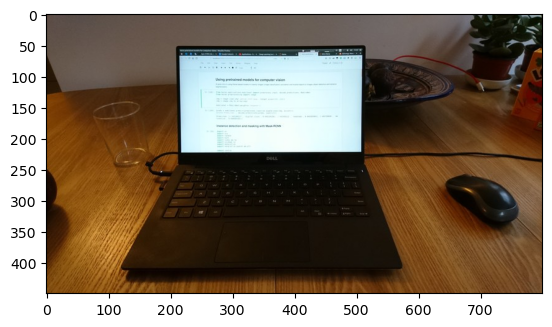

In [23]:
image = camera_grab(camera_id=0, fallback_filename='laptop.jpeg')
plt.imshow(image)
print("dtype: {}, shape: {}, range: {}".format(
    image.dtype, image.shape, (image.min(), image.max())))


### Aufgabe

- Schreiben Sie eine Funktion namens „classify“, die einen Schnappschuss der Webcam erstellt und ihn zusammen mit den dekodierten Vorhersagen des Modells und deren Konfidenzniveau anzeigt.

- Wenn Sie keinen Zugang zu einer Webcam haben, machen Sie ein Foto mit Ihrem Mobiltelefon oder ein Foto Ihrer Wahl aus dem Internet, speichern Sie es stattdessen als JPEG-Datei auf der Festplatte und übergeben Sie diese Datei an das neuronale Netzwerk, um die Vorhersage zu treffen .

- Versuchen Sie, ein Foto Ihres Gesichts einzuordnen. Schauen Sie sich das Konfidenzniveau an. Können Sie die Ergebnisse erklären?

- Versuchen Sie, Fotos von gewöhnlichen Objekten wie einem Buch, einem Mobiltelefon, einer Tasse usw. zu klassifizieren. Versuchen Sie, die Objekte zu zentrieren und Unordnung zu beseitigen, um eine Zuverlässigkeit von mehr als 0,5 zu erreichen.

dtype: uint8, shape: (299, 299, 3), range: (0, 255)


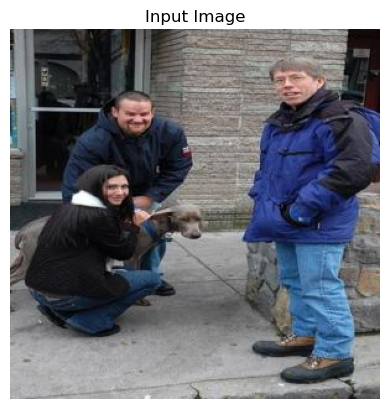

1/1 [==============================] - 2s 2s/step
Predictions:
crutch: 0.099
clumber: 0.077
sleeping_bag: 0.068


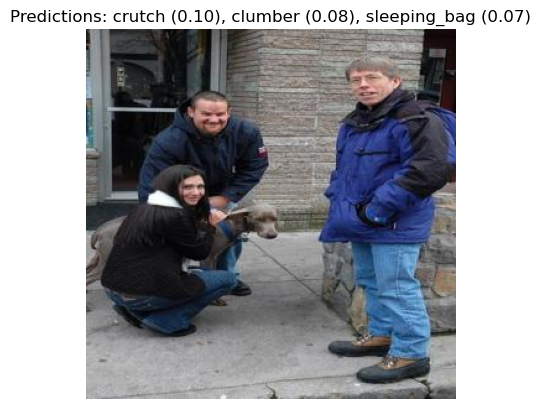

In [65]:
import cv2
import numpy as np
import matplotlib.pyplot as plt
from skimage.io import imread
from skimage.transform import resize
from tensorflow.keras.applications.resnet50 import ResNet50, preprocess_input, decode_predictions


#image = camera_grab(camera_id=0, fallback_filename='images_resize/0000021.jpg')
image = imread("21.jpg")
plt.imshow(image)
print("dtype: {}, shape: {}, range: {}".format(
    image.dtype, image.shape, (image.min(), image.max())))

def classify():
    # Erfassen Sie das Bild oder laden Sie den Fallback
    image = imread('21.jpg')
    if image is None:
        print("No image available!")
        return

    # Anzeige des Eingabebildes
    plt.imshow(image)
    plt.title("Input Image")
    plt.axis('off')
    plt.show()

    # Vorverarbeitung: Skalieren auf 224x224 und Umwandlung in float32
    image_resized = cv2.resize(image, (224, 224)).astype("float32")
    image_batch = np.expand_dims(image_resized, axis=0)
    image_batch = preprocess_input(image_batch)

    # Laden des vorab trainierten ResNet50-Modells
    model = ResNet50(include_top=True, weights='imagenet')

    # Klassifizierung durchführen und Vorhersagen decodieren
    preds = model.predict(image_batch)
    decoded = decode_predictions(preds, top=3)[0]
    print("Predictions:")
    for pred in decoded:
        print(f"{pred[1]}: {pred[2]:.3f}")

    # Anzeige des Bildes mit den Top-Vorhersagen im Titel
    prediction_text = ", ".join([f"{pred[1]} ({pred[2]:.2f})" for pred in decoded])
    plt.imshow(image)
    plt.title("Predictions: " + prediction_text)
    plt.axis('off')
    plt.show()

classify()

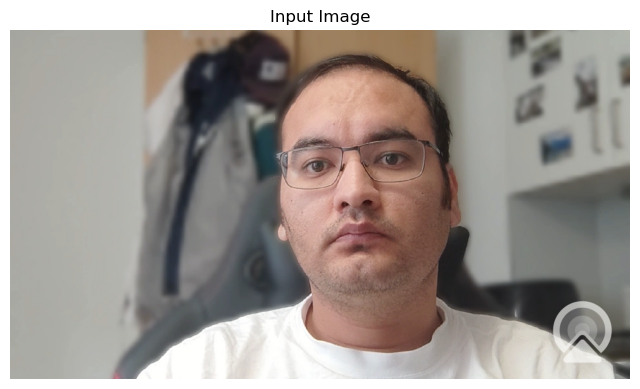

Predictions:
1. jersey: 0.2140 (21.4%)
2. lab_coat: 0.0937 (9.4%)
3. cleaver: 0.0521 (5.2%)
4. dumbbell: 0.0515 (5.2%)
5. spatula: 0.0492 (4.9%)


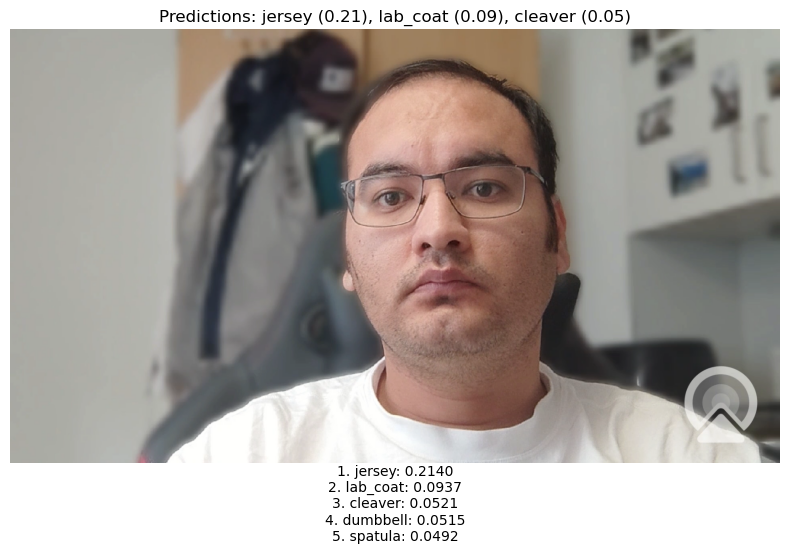

[('n03595614', 'jersey', 0.21402207),
 ('n03630383', 'lab_coat', 0.09368296),
 ('n03041632', 'cleaver', 0.052125614),
 ('n03255030', 'dumbbell', 0.05151369),
 ('n04270147', 'spatula', 0.04923146)]

In [ ]:
import cv2
import numpy as np
import matplotlib.pyplot as plt
from skimage.io import imread
from skimage.transform import resize
from tensorflow.keras.applications.resnet50 import ResNet50, preprocess_input, decode_predictions



def classify():
    """
    Captures an image from webcam (or uses fallback image), classifies it using a 
    pre-trained ResNet50 model, and displays the predictions with confidence scores.
    """
    # Step 1: Capture image from webcam or use fallback
    image = camera_grab(camera_id=0, fallback_filename='laptop.jpeg')
    if image is None:
        print("No image available!")
        return
    
    # Step 2: Display the input image
    plt.figure(figsize=(8, 6))
    plt.imshow(image)
    plt.title("Input Image")
    plt.axis('off')
    plt.show()
    
    # Step 3: Preprocess the image for ResNet50
    # ResNet50 expects images with shape (224, 224, 3) and float32 type
    image_resized = resize(image, (224, 224), mode='reflect', 
                          anti_aliasing=True, preserve_range=True).astype("float32")
    
    # Add batch dimension and apply model-specific preprocessing
    image_batch = np.expand_dims(image_resized, axis=0)
    image_batch = preprocess_input(image_batch)
    
    # Step 4: Load the pre-trained ResNet50 model
    model = ResNet50(include_top=True, weights='imagenet')
    
    # Step 5: Make predictions
    preds = model.predict(image_batch)
    
    # Step 6: Decode and display the top 5 predictions
    decoded = decode_predictions(preds, top=5)[0]
    print("Predictions:")
    for i, (id, label, score) in enumerate(decoded):
        print(f"{i+1}. {label}: {score:.4f} ({score*100:.1f}%)")
    
    # Step 7: Display image with predictions as title
    plt.figure(figsize=(8, 6))
    plt.imshow(image)
    
    # Create formatted title with top 3 predictions
    prediction_text = ", ".join([f"{pred[1]} ({pred[2]:.2f})" for pred in decoded[:3]])
    plt.title(f"Predictions: {prediction_text}", fontsize=12)
    
    # Add detailed predictions as text below the image
    plt.figtext(0.5, 0.01, 
                "\n".join([f"{i+1}. {label}: {score:.4f}" for i, (_, label, score) in enumerate(decoded[:5])]), 
                ha="center", fontsize=10)
    
    plt.axis('off')
    plt.tight_layout()
    plt.show()

    return decoded

    
classify()
# model würde auf 1000 Objekte trainiert und Menschen Gesicht ist keine davon gewesen

### Aufgabe

- Schreiben Sie eine Funktion namens „classify“, die einen Schnappschuss der Webcam erstellt und ihn zusammen mit den dekodierten Vorhersagen des Modells und deren Konfidenzniveau anzeigt.

- Wenn Sie keinen Zugang zu einer Webcam haben, machen Sie ein Foto mit Ihrem Mobiltelefon oder ein Foto Ihrer Wahl aus dem Internet, speichern Sie es stattdessen als JPEG-Datei auf der Festplatte und übergeben Sie diese Datei an das neuronale Netzwerk, um die Vorhersage zu treffen .

- Versuchen Sie, ein Foto Ihres Gesichts einzuordnen. Schauen Sie sich das Konfidenzniveau an. Können Sie die Ergebnisse erklären?

- Versuchen Sie, Fotos von gewöhnlichen Objekten wie einem Buch, einem Mobiltelefon, einer Tasse usw. zu klassifizieren. Versuchen Sie, die Objekte zu zentrieren und Unordnung zu beseitigen, um eine Zuverlässigkeit von mehr als 0,5 zu erreichen.

# Berechnen der Darstellungen von Bildern

Stellen wir zunächst sicher, dass Sie Zugriff auf eine Teilmenge der Bilddateien aus dem PASCAL VOC-Datensatz haben, den wir verwenden werden.

In [14]:
import os.path as op
from zipfile import ZipFile

if not op.exists("images_resize"):
    print('Extracting image files...')
    zf = ZipFile('images_pascalVOC.zip')
    zf.extractall('.')

Erstellen wir ein neues Modell, das den Bildeingaberaum der Ausgabe der Ebene vor der letzten Ebene des vorab trainierten Resnet 50-Modells zuordnet. Wir nennen dieses neue Modell das „Basismodell“:


In [19]:
# Zuerst die notwendigen Importe
import tensorflow as tf
from tensorflow.keras.applications.resnet50 import ResNet50
from tensorflow.keras.models import Model
from tensorflow.keras.preprocessing import image

# Laden des ResNet50-Modells
model = ResNet50(include_top=True, weights='imagenet')
input = model.layers[0].input
output = model.layers[-2].output
base_model = Model(input, output)
base_model.output_shape

(None, 2048)

Das Basismodell kann jedes Bild in einen flachen, hochdimensionalen, semantischen Merkmalsvektor umwandeln:


AttributeError: module 'cv2' has no attribute 'imresize'

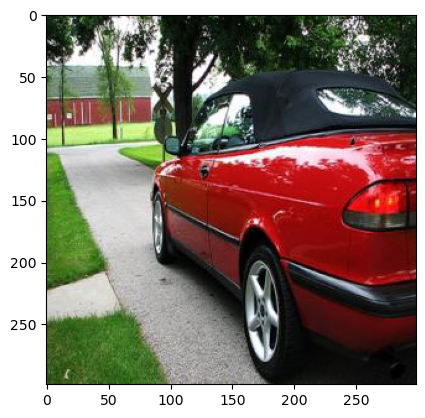

In [20]:


path = "images_resize/000007.jpg"

img = imread(path)
plt.imshow(img)

img = cv2.imresize(img, (224,224)).astype("float32")
# add a dimension for a "batch" of 1 image
img_batch = preprocess_input(img[np.newaxis]) 
representation = base_model.predict(img_batch)
print("Shape of representation:", representation.shape)

Die Berechnung der Darstellung aller Bilder kann zeitaufwändig sein.
Dies erfolgt normalerweise in großen Mengen auf einer GPU, um enorme Leistungssteigerungen zu erzielen.

Für den verbleibenden Teil verwenden wir vorberechnete Darstellungen, die im h5-Format gespeichert sind.

In [56]:
import os
paths = ["images_resize/" + path
         for path in sorted(os.listdir("images_resize/"))]

In [57]:
import h5py

with h5py.File('img_emb.h5', 'r') as h5f:
    out_tensors = h5f['img_emb'][:]
    
out_tensors.shape

(504, 2048)

In [58]:
out_tensors.dtype

dtype('float32')

**Aufgabe**
- Wie groß ist der Anteil der 0-Werte in dieser Darstellung?
- Können Sie negative Werte finden?
- Warum gibt es so viele Nullwerte?
- Liegt der Nullpunkt für verschiedene Eingabebilder immer in den gleichen Dimensionen?

Anteil der 0-Werte: 0.1252 (129202 von 1032192 Werten)
Keine negativen Werte gefunden


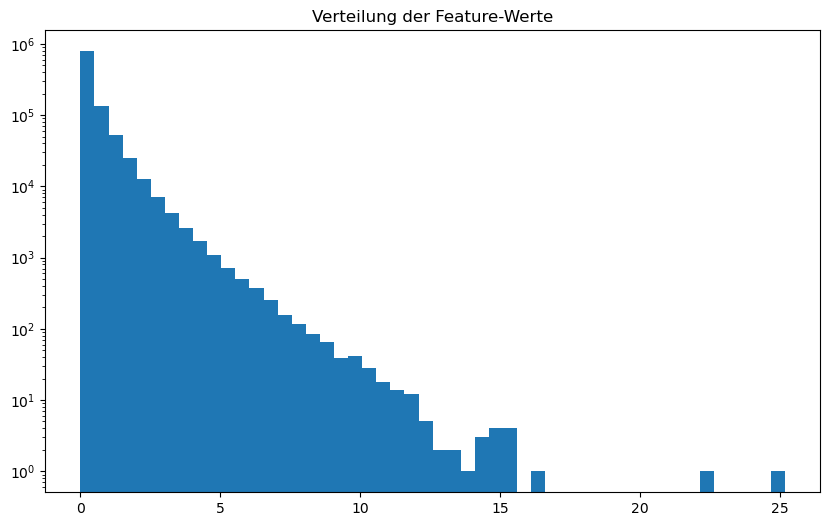

Anzahl der Dimensionen, die immer null sind: 0


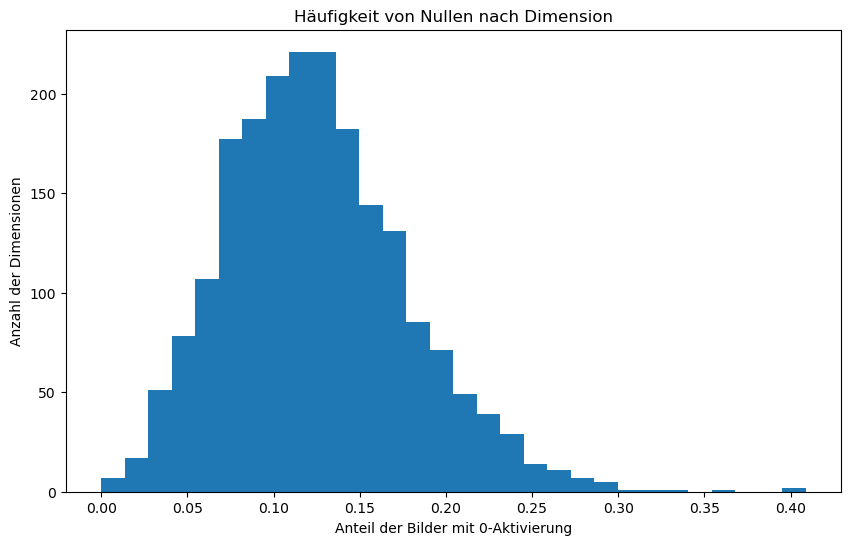

In [10]:
import numpy as np
import matplotlib.pyplot as plt
import h5py
import os
import skimage.io as io
import tensorflow.keras.applications.resnet50 as resnet50


# 1. Anteil der 0-Werte berechnen
zero_count = np.sum(out_tensors == 0)
total_count = out_tensors.size
proportion_zeros = zero_count / total_count
print(f"Anteil der 0-Werte: {proportion_zeros:.4f} ({zero_count} von {total_count} Werten)")

# 2. Überprüfen auf negative Werte
has_negative = np.any(out_tensors < 0)
if has_negative:
    neg_count = np.sum(out_tensors < 0)
    print(f"Gefunden: {neg_count} negative Werte")
    print(f"Minimaler Wert: {out_tensors.min()}")
else:
    print("Keine negativen Werte gefunden")

# 3. Zum besseren Verständnis: Verteilung der Werte visualisieren
plt.figure(figsize=(10, 6))
plt.hist(out_tensors.flatten(), bins=50)
plt.title("Verteilung der Feature-Werte")
plt.yscale('log')  # Logarithmische Skala für bessere Sichtbarkeit
plt.show()

# 4. Überprüfen ob Nullen immer in denselben Dimensionen auftreten
# Dimensionen, die IMMER null sind über alle Bilder
always_zero_dims = np.all(out_tensors == 0, axis=0)
print(f"Anzahl der Dimensionen, die immer null sind: {np.sum(always_zero_dims)}")


# Visualisierung der 0-Verteilung über Dimensionen
plt.figure(figsize=(10, 6))
plt.hist(zero_freq_by_dim, bins=30)
plt.title('Häufigkeit von Nullen nach Dimension')
plt.xlabel('Anteil der Bilder mit 0-Aktivierung')
plt.ylabel('Anzahl der Dimensionen')
plt.show()

1. Anteil der 0-Werte in der Darstellung:

Bei ResNet50-Merkmalen ist typischerweise ein erheblicher Teil der Werte (oft >50%) gleich Null.

2.Negative Werte:

In ResNet50-Merkmalen sollten keine negativen Werte vorkommen, da die letzte Schicht vor dem Klassifikator typischerweise eine ReLU-Aktivierung verwendet.

3.Warum so viele Nullwerte?

Die vielen 0-Werte entstehen durch die ReLU-Aktivierungsfunktion, die negative Eingaben auf 0 setzt: f(x) = max(0, x)
Dies führt zu einer Eigenschaft namens "Sparsity" (Dünnbesetztheit), die in neuronalen Netzwerken oft erwünscht ist
Sparse Aktivierungen verbessern häufig die Generalisierungsfähigkeit und Recheneffizienz

4.Nullpunkte in gleichen Dimensionen:

 könnte dies darauf hindeuten, dass diese Merkmale für den Datensatz nicht relevant sind oder vom Modell nie aktiviert werden.


Lassen Sie uns mit T-SNE eine 2D-Darstellung dieses hochdimensionalen Merkmalsraums finden:

In [38]:
from sklearn.manifold import TSNE

img_emb_tsne = TSNE(perplexity=30).fit_transform(out_tensors)

/Users/majatemerinac-ott/anaconda3/envs/homl3/lib/python3.10/site-packages/sklearn/manifold/_t_sne.py:800: FutureWarning: The default initialization in TSNE will change from 'random' to 'pca' in 1.2.
  warnings.warn(
/Users/majatemerinac-ott/anaconda3/envs/homl3/lib/python3.10/site-packages/sklearn/manifold/_t_sne.py:810: FutureWarning: The default learning rate in TSNE will change from 200.0 to 'auto' in 1.2.
  warnings.warn(


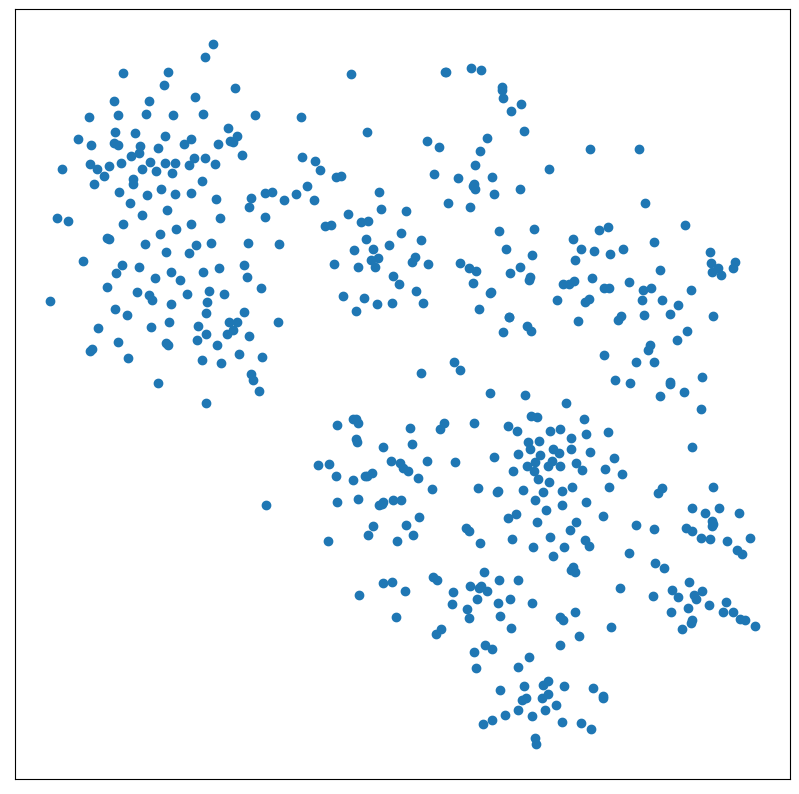

In [39]:
import matplotlib.pyplot as plt

plt.figure(figsize=(10, 10))
plt.scatter(img_emb_tsne[:, 0], img_emb_tsne[:, 1]);
plt.xticks(()); plt.yticks(());
plt.show()

Let's add thumnails of the original images at their TSNE locations:

In [40]:
import matplotlib
import matplotlib.pyplot as plt
from matplotlib.offsetbox import OffsetImage, AnnotationBbox
from skimage.io import imread
from skimage.transform import resize

def imscatter(x, y, paths, ax=None, zoom=1, linewidth=0):
    if ax is None:
        ax = plt.gca()
    x, y = np.atleast_1d(x, y)
    artists = []
    for x0, y0, p in zip(x, y, paths):
        try:
            im = imread(p)
        except:
            print(p)
            continue
        im = resize(im, (224, 224), preserve_range=False, mode='reflect')
        im = OffsetImage(im, zoom=zoom)
        ab = AnnotationBbox(im, (x0, y0), xycoords='data',
                            frameon=True, pad=0.1, 
                            bboxprops=dict(edgecolor='red',
                                           linewidth=linewidth))
        artists.append(ax.add_artist(ab))
    ax.update_datalim(np.column_stack([x, y]))
    ax.autoscale()
    return artists

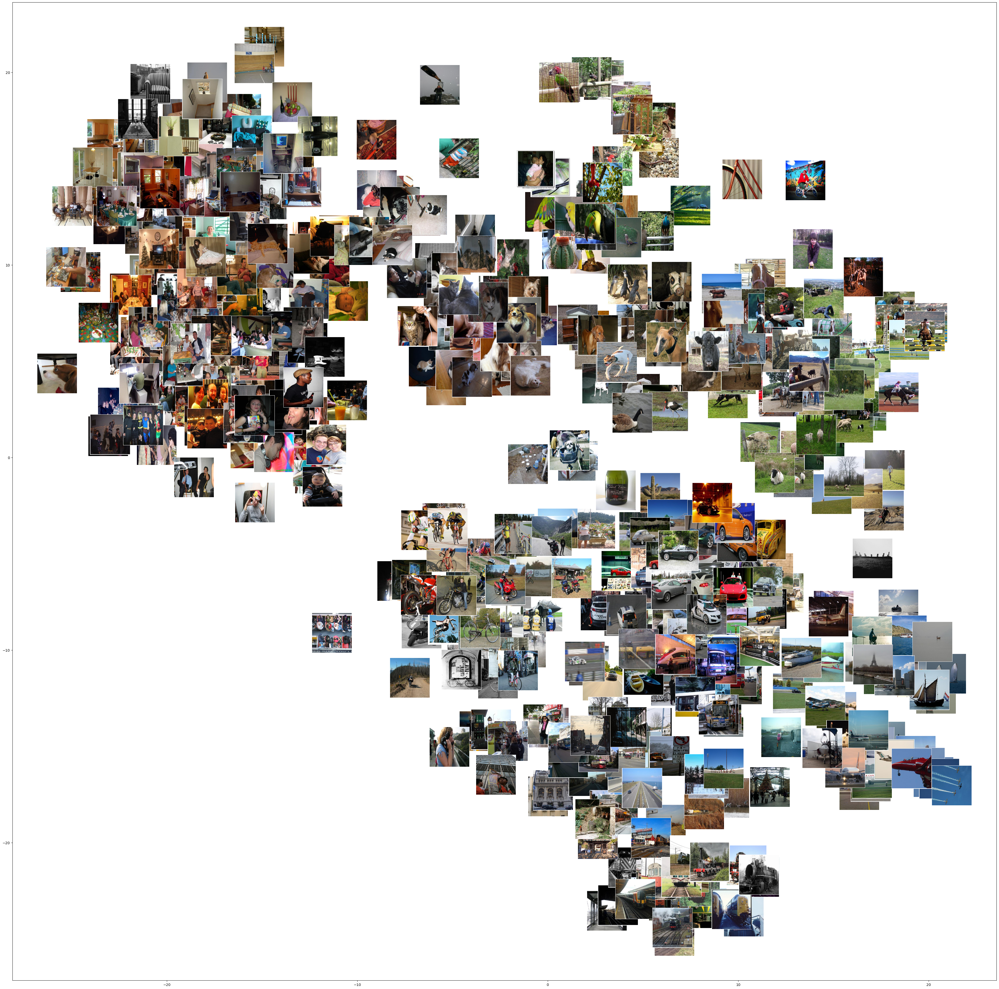

In [41]:
fig, ax = plt.subplots(figsize=(50, 50))
imscatter(img_emb_tsne[:, 0], img_emb_tsne[:, 1], paths, zoom=0.5, ax=ax)
plt.savefig('tsne.png')

### Visual Search: finding similar images

In [42]:
def display(img):
    plt.figure()
    img = imread(img)
    plt.imshow(img)

In [59]:
idx = 8

def most_similar(idx, top_n=5):
    dists = np.linalg.norm(out_tensors - out_tensors[idx], axis = 1)
    sorted_dists = np.argsort(dists)
    return sorted_dists[:top_n]

sim = most_similar(idx)
[display(paths[s]) for s in sim];

'images_resize/000021.jpg'

'images_resize/000192.jpg'

'images_resize/000269.jpg'

'images_resize/000694.jpg'

'images_resize/000433.jpg'

# Klassifizierung durch die nächsten Nachbarn?

Mithilfe dieser Darstellungen kann möglicherweise ein Klassifikator für den nächsten Nachbarn erstellt werden. 

Testen Sie wie gut Sie ähnliche Bilder gleicher Klasse finden können.

Wiederholen Sie das Vorgehen, indem Sie ImageNet anstatt MobileNetv2 als Modell verwenden.

In [44]:
out_norms = np.linalg.norm(out_tensors, axis=1, keepdims=True)
normed_out_tensors = out_tensors / out_norms

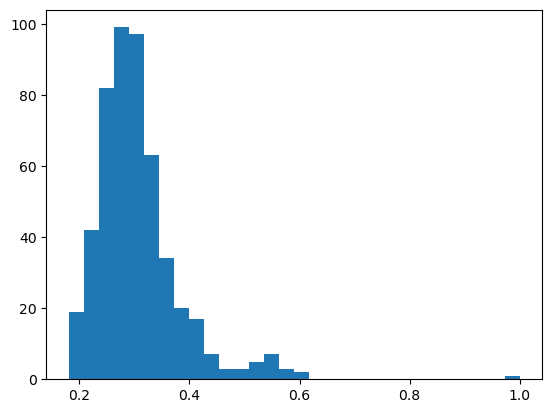

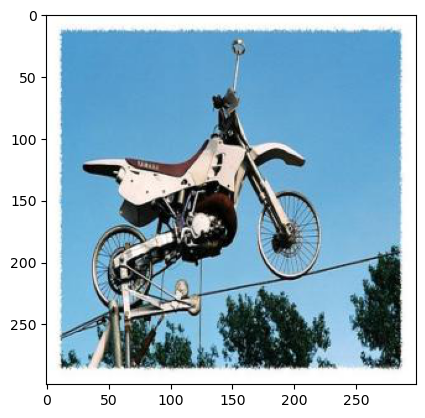

In [45]:
item_idx = 208
dists_to_item = np.linalg.norm(out_tensors - out_tensors[item_idx],
                               axis=1)
cos_to_item = np.dot(normed_out_tensors, normed_out_tensors[item_idx]) 
plt.hist(cos_to_item, bins=30)
display(paths[item_idx])